In [1]:
import os # Trains on CPU only, use only for model evaluation since loading the entire dataset into the GPU gives OOM
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

import keras
from keras.utils import plot_model
from keras.datasets import mnist
from keras.models import Sequential, Model, model_from_json
from keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, Conv2DTranspose, UpSampling2D, LeakyReLU, Lambda
from keras.layers.merge import concatenate
from keras.constraints import max_norm
from keras import backend as K
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from tqdm.keras import TqdmCallback
from skimage.metrics import structural_similarity, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from pathlib import Path

import cv2
import tensorflow as tf
import matplotlib.image as mpimg
import matplotlib.pyplot as plt 
import seaborn as sns
import pandas as pd
import numpy as np
import pathlib
import gc
import os
import random

import logging
logger = logging.getLogger()
logger.setLevel(100) # Set logging level to disable matplotlib warning when using imshow for normalised data

%matplotlib inline

Using TensorFlow backend.


Define image parameters (256 by 256 resized square image) and process training and validation sets

In [2]:
# Image Parameters
img_width, img_height = 256, 256
noise_factor_low = 5/255
noise_factor_high = 50/255
input_shape = (img_width, img_height, 3)

In [3]:
train_imgs = ['ILSVR_1000/{}'.format(i) for i in os.listdir('ILSVR_1000')] 
val_imgs = ['selfsupervised-denoising-master/datasets/kodak/{}'.format(i) for i in os.listdir('selfsupervised-denoising-master/datasets/kodak')]

def rand_state():
  return 0.3845

random.shuffle(train_imgs, rand_state)  # shuffle it randomly
gc.collect();   # collect garbage to save memory

In [4]:
def read_and_process_image(list_of_images):
    imglist = [] 
    
    for image in list_of_images:
        imglist.append(cv2.cvtColor(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR), (img_width,img_height)), cv2.COLOR_BGR2RGB))
    
    return imglist

In [5]:
x_train = read_and_process_image(train_imgs) # ILSVR_1000 training set of 1000 images
x_val = read_and_process_image(val_imgs)     # Kodak validation set

In [6]:
def plot_images(images, n_plots=5):
    fig, ax = plt.subplots(1, n_plots, figsize=(5*n_plots, 4))

    for i, a in zip(images, ax):
        a.imshow(i)
        a.axis('off')

Plot both training set from ILSVR and the Kodak validation set from the paper.

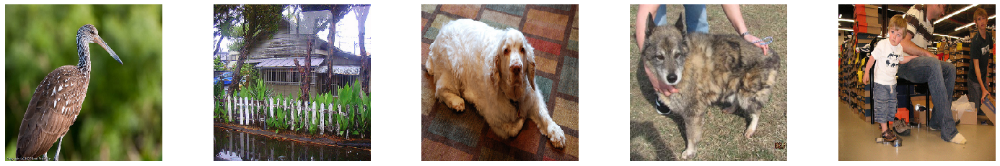

In [7]:
plot_images(x_train) # ILSVR_1000 training set of 1000 images

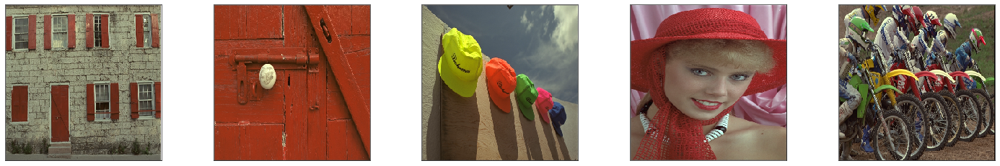

In [8]:
plot_images(x_val) # Kodak validation set

Normalise the data and add noise. `noise_factor_low` and `noise_factor_high` corresponds to the minimum and maximum standard deviation range for the noise. We will use a range of [5, 50] in this case, so as to match the paper's configuration.

In [9]:
# Normalize data
x_train = [(i / 255) for i in x_train]
x_val = [(i / 255) for i in x_val]

In [10]:
operation_seed_counter = 0

def get_seed():
    global operation_seed_counter
    operation_seed_counter += 1
    return operation_seed_counter

# Add Gaussian Noise
def add_gaussian_noise(img_list):
    noised_imgs = [(np.random.normal(0, 1, i.shape)) for i in img_list]
    noised_imgs = [sum(x) for x in zip(img_list, [(random.uniform(noise_factor_low, noise_factor_high) * i) for i in noised_imgs])]
    return [np.clip(i, 0, 1) for i in noised_imgs]

# Add Uniform Noise
def add_uniform_noise(img_list):
    noised_imgs = [(np.random.uniform(0, 1, i.shape)) for i in img_list]
    noised_imgs = [sum(x) for x in zip(img_list, [(random.uniform(noise_factor_low, noise_factor_high) * i) for i in noised_imgs])]
    return [np.clip(i, 0, 1) for i in noised_imgs]

# Add Poisson Noise
def add_poisson_noise(img_list):
    noised_imgs = [(np.random.poisson(1, i.shape)) for i in img_list]
    noised_imgs = [sum(x) for x in zip(img_list, [(random.uniform(noise_factor_low, noise_factor_high) * i) for i in noised_imgs])]
    return [np.clip(i, 0, 1) for i in noised_imgs]

# Add Impulse Noise
def add_impulse_noise(img_list, min_a=0, max_a=1):
    num_samples = len(img_list)
    msh = [num_samples, 256, 256, 1]
    alpha = tf.random.uniform(shape=[num_samples, 1, 1, 1], minval=min_a, maxval=max_a, seed=get_seed())
    keep_mask = tf.where(tf.random.uniform(shape=msh, seed=get_seed()) >= tf.ones(shape=msh) * alpha, tf.ones(shape=msh), tf.zeros(shape=msh))
    noise = tf.random.uniform(shape=tf.shape(img_list), seed=get_seed())
    return (img_list * keep_mask + noise * (1.0 - keep_mask)).numpy()

For the N2C model, we will be training on noisy and clean image pairs. Noisy images will be fed into the model and the clean images will be the targets for the model.

In [11]:
x_train_gauss = add_gaussian_noise(x_train)
#x_train_gauss_targets = add_gaussian_noise(x_train)

x_train_poiss = add_poisson_noise(x_train)
#x_train_poiss_targets = add_poisson_noise(x_train)

x_train_imp = add_impulse_noise(x_train)
#x_train_imp_targets = add_impulse_noise(x_train)

In [12]:
x_val_gauss = add_gaussian_noise(x_val)
x_val_poiss = add_poisson_noise(x_val)
x_val_imp = add_impulse_noise(x_val)

In [13]:
# if not os.path.exists('pure_set_100p'):
#     os.makedirs('pure_set_100p')

# if not os.path.exists('gaussian_100p'):
#     os.makedirs('gaussian_100p')
    
# if not os.path.exists('poisson_100p'):
#     os.makedirs('poisson_100p')

In [14]:
# for i in range(0, 100):
#     img_s = 255*x_train[i].astype(np.float32)
#     img_g = 255*x_train_gauss[i].astype(np.float32)
#     img_p = 255*x_train_poiss[i].astype(np.float32)
#     cv2.imwrite('pure_set_100p/pure%s.jpg' % i, cv2.cvtColor(img_s, cv2.COLOR_RGB2BGR))
#     cv2.imwrite('gaussian_100p/gaussian_noise%s.jpg' % i, cv2.cvtColor(img_g, cv2.COLOR_RGB2BGR))
#     cv2.imwrite('poisson_100p/poisson_noise%s.jpg' % i, cv2.cvtColor(img_p, cv2.COLOR_RGB2BGR))

Plot the noisy training and validation images for visualisation.

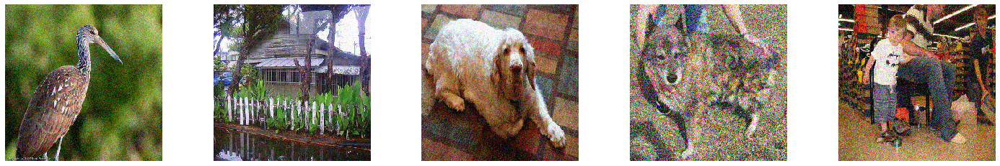

In [15]:
plot_images(x_train_gauss)  # Noisy Gaussian Training Images

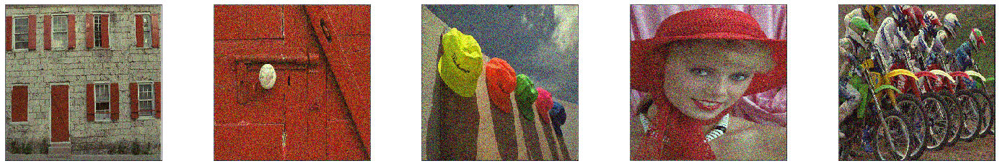

In [16]:
plot_images(x_val_gauss)   # Noisy Gaussian Validation Images

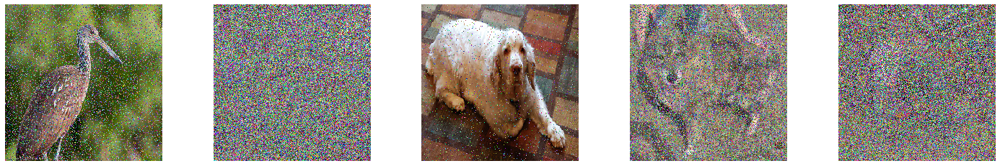

In [17]:
plot_images(x_train_imp)  # Noisy Impulse Training Images

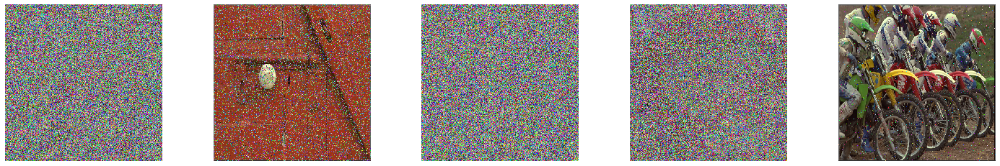

In [18]:
plot_images(x_val_imp)    # Noisy Impulse Validation Images

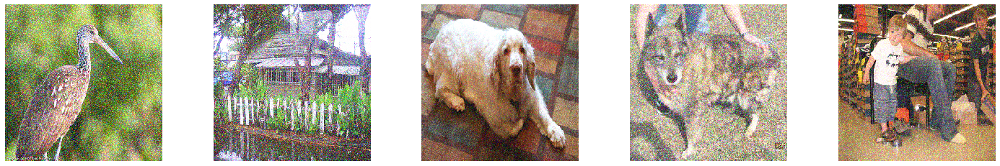

In [19]:
plot_images(x_train_poiss) # Noisy Poisson Training Images

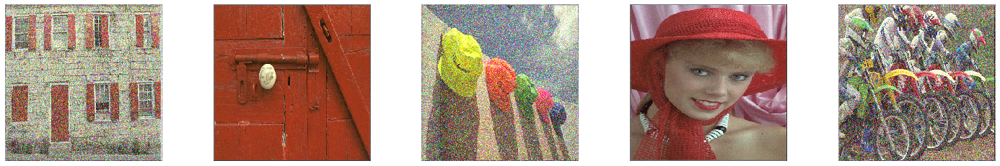

In [20]:
plot_images(x_val_poiss)  # Noisy Poisson Validation Images

The below is our implementation for the paper's autoencoder u-net model, with optional blind spot.

In [21]:
# Backbone autoencoder network, optional blind spot.
blindspot = False

def up(n):
    s = tf.shape(n)
    s = [-1, n.shape[1], s[2], s[3]]
    n = tf.reshape(n, [s[0], s[1], s[2], 1, s[3], 1])
    n = tf.tile(n, [1, 1, 1, 2, 1, 2])
    n = tf.reshape(n, [s[0], s[1], s[2] * 2, s[3] * 2])
    return n

def down(n):
    n = tf.pad(n[:, :, :-1, :], [[0, 0], [0, 0], [1, 0], [0, 0]])
    n = tf.nn.max_pool(n, ksize=[1, 1, 2, 2], strides=[1, 1, 2, 2], padding='SAME', data_format='NHWC')
    return n

def rotate(x, angle):
    if   angle == 0:   return x
    elif angle == 90:  return tf.transpose(x[:, :, :, ::-1], [0, 1, 2, 3])
    elif angle == 180: return x[:, :, ::-1, ::-1]
    elif angle == 270: return tf.transpose(x[:, :, ::-1, :], [0, 1, 2, 3])

def concat(layers):
    return tf.concat(layers, axis=3)

def input_rotation(n):
    return tf.concat([rotate(n, a) for a in [0, 90, 180, 270]], axis=3)

def output_rotation(n):
    return tf.concat([rotate(n, a) for a in [0, 270, 180, 90]], axis=3)

def rotate90(x):
    return tf.transpose(x[:, :, :, ::-1], [0, 1, 2, 3])

def rotate180(x):
    return x[:, :, ::-1, ::-1]

def rotate270(x):
    return tf.transpose(x[:, :, ::-1, :], [0, 1, 2, 3])

def shift_and_pad(x):
    return tf.pad(x[:, :, :-1, :], [[0, 0], [0, 0], [1, 0], [0, 0]])

def split(x):
    return tf.split(x, 4, axis=3)

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:104: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("ni...)`


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
enc_conv0 (Conv2D)              (None, 256, 256, 48) 1344        input_1[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_1 (LeakyReLU)       (None, 256, 256, 48) 0           enc_conv0[0][0]                  
__________________________________________________________________________________________________
enc_conv1 (Conv2D)              (None, 256, 256, 48) 20784       leaky_re_lu_1[0][0]              
____________________________________________________________________________________________

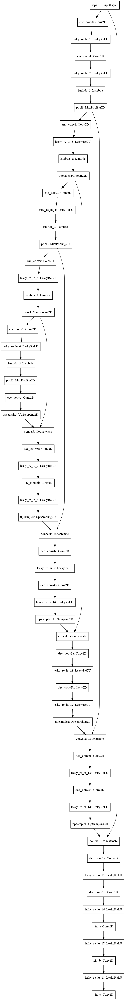

In [22]:
# Input stage
inputs = Input(input_shape)

if not blindspot:
    x = inputs
else:
    x = Lambda(input_rotation, name='rotate_inputs')(inputs)

# Encoder part
pool0 = x
x = Conv2D(48, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='enc_conv0')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Conv2D(48, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='enc_conv1')(x)
x = LeakyReLU(alpha=0.1)(x)  
x = Lambda(shift_and_pad)(x)
x = MaxPooling2D(pool_size=(1, 2), strides=(1, 2), padding = 'same', data_format='channels_last', name='pool1')(x); pool1 = x

x = Conv2D(48, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='enc_conv2')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Lambda(shift_and_pad)(x)
x = MaxPooling2D(pool_size=(1, 2), strides=(1, 2), padding = 'same', data_format='channels_last', name='pool2')(x); pool2 = x

x = Conv2D(48, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='enc_conv3')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Lambda(shift_and_pad)(x)
x = MaxPooling2D(pool_size=(1, 2), strides=(1, 2), padding = 'same', data_format='channels_last', name='pool3')(x); pool3 = x

x = Conv2D(48, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='enc_conv4')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Lambda(shift_and_pad)(x)
x = MaxPooling2D(pool_size=(1, 2), strides=(1, 2), padding = 'same', data_format='channels_last', name='pool4')(x); pool4 = x

x = Conv2D(48, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='enc_conv5')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Lambda(shift_and_pad)(x)
x = MaxPooling2D(pool_size=(1, 2), strides=(1, 2), padding = 'same', data_format='channels_last', name='pool5')(x); pool5 = x

x = Conv2D(48, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='enc_conv6')(x)

# Decoder part
x = UpSampling2D(size = (1, 2), name='upsample5')(x)
x = concatenate([x, pool4], axis=3, name='concat5')
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv5a')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv5b')(x)
x = LeakyReLU(alpha=0.1)(x)

x = UpSampling2D(size = (1, 2), name='upsample4')(x)
x = concatenate([x, pool3], axis=3, name='concat4')
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv4a')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv4b')(x)
x = LeakyReLU(alpha=0.1)(x)

x = UpSampling2D(size = (1, 2), name='upsample3')(x)
x = concatenate([x, pool2], axis=3, name='concat3')
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv3a')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv3b')(x)
x = LeakyReLU(alpha=0.1)(x)

x = UpSampling2D(size = (1, 2), name='upsample2')(x)
x = concatenate([x, pool1], axis=3, name='concat2')
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv2a')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv2b')(x)
x = LeakyReLU(alpha=0.1)(x)

x = UpSampling2D(size = (1, 2), name='upsample1')(x)
x = concatenate([x, pool0], axis=3, name='concat1')

# Output stages

if blindspot:
    # Blind-spot output stages
    x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv1a')(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv1b')(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Lambda(shift_and_pad, name='shift_and_pad')(x)
    x = Lambda(split, name='split')(x)
    rot90s = Lambda(rotate90)(x[3])
    rot180s = Lambda(rotate180)(x[2])
    rot270s = Lambda(rotate270)(x[1])
    x = concatenate([x[0], rot90s, rot180s, rot270s], axis=3)   # Combine on channel axis.
    x = Conv2D(96*4, 1, strides=(1, 1), padding = 'same', data_format='channels_last', name='nin_a')(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(96, 1, strides=(1, 1), padding = 'same', data_format='channels_last', name='nin_b')(x)
    x = LeakyReLU(alpha=0.1)(x)
    outputs = Conv2D(3, 1, activation = 'linear', name='nin_c')(x)

else:
    # Baseline network with postprocessing layers -- keep feature maps and distill with 1x1 convolutions
    x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv1a')(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(96, 3, strides=(1, 1), padding = 'same', data_format='channels_last', name='dec_conv1b')(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(96*4, 1, strides=(1, 1), padding = 'same', data_format='channels_last', name='nin_a')(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(96, 1, strides=(1, 1), padding = 'same', data_format='channels_last', name='nin_b')(x)
    x = LeakyReLU(alpha=0.1)(x)
    outputs = Conv2D(3, 1, activation = 'linear', name='nin_c')(x)

model = Model(input = inputs, output = outputs)

# Summarize layers
print(model.summary())

# Plot model architecture
plot_model(model, to_file='shared_input_layer.png')

In [23]:
# Save model architecture to JSON
model_json = model.to_json()
with open("n2n_n2c_no_blindspot_unet_model.json", "w") as json_file:
    json_file.write(model_json)

We define a set of different metrics for comparison and to measure the model's performance.

In [24]:
def MSE(pure, target):
    return mean_squared_error(pure, target)

def PSNR(pure, target):
    max_pixel = 1.0
    return (tf.image.psnr(pure, target, max_pixel))

def SSIM(pure, target):
    return tf.image.ssim(pure, target, max_val = 1)

def SSIM_cv(pure, target):
    return structural_similarity(pure, target, dynamic_range=1, multichannel=True)

The model is then trained and saved below.

In [25]:
adam = optimizers.Adam(learning_rate=0.0003)

def train_and_save(model, path, history_path, **kwargs):
    if path.exists() and history_path.exists():
        model.load_weights(str(path))
        history=pd.read_csv(str(history_path), sep=',')  
        return history
    else:
        model.compile(optimizer=adam, loss='mean_squared_error', metrics=[PSNR, SSIM, 'mse'])
        history = model.fit(**kwargs)
        model.save_weights(str(path))
        history = pd.DataFrame(history.history)
        history.to_csv(str(history_path), sep=',')
        return history

In [26]:
# Using the paper's Impulse N2C network (Varying Alpha of 0 to 100)
history_bs = train_and_save(
    model=model,
    path=Path('./n2c_imp_0_100.h5'),
    history_path=Path('./n2c_imp_0_100_hist.csv'),
    x=np.array(x_train_imp),
    y=np.array(x_train), # x_train for N2C
    batch_size=4,
    validation_split=0.2,
    verbose=0,
    epochs=100,
    callbacks=[TqdmCallback(verbose=1)],
)

We plot the history graphs for loss and each metric to see if our model converges well after training and if we have overfitted or underfitted.

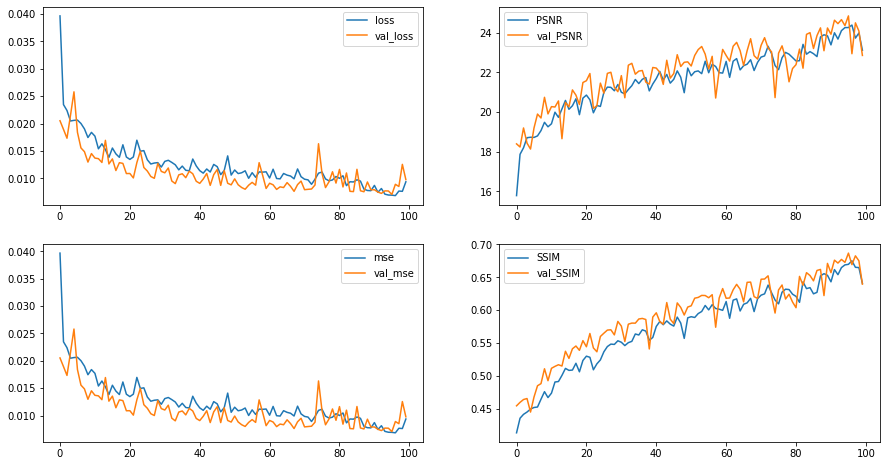

In [27]:
# Using the paper's Impulse N2C network (Varying Alpha of 0 to 100)
fig, ax = plt.subplots(2, 2, figsize=(15, 8))
history_bs.plot(y=['loss', 'val_loss'], ax=ax[0, 0])
history_bs.plot(y=['PSNR', 'val_PSNR'], ax=ax[0, 1])
history_bs.plot(y=['mse', 'val_mse'], ax=ax[1, 0])
history_bs.plot(y=['SSIM', 'val_SSIM'], ax=ax[1, 1]);

In [28]:
# Using the paper's Impulse N2C network (Varying Alpha of 0 to 100)
pd.set_option('display.max_rows', None)
history_bs

,Unnamed: 0,val_loss,val_PSNR,val_SSIM,val_mse,loss,PSNR,SSIM,mse
0,0,0.020515,18.391308,0.454927,0.020515,0.039662,15.781031,0.413969,0.039662
1,1,0.018938,18.233244,0.460180,0.018938,0.023462,17.864155,0.436123,0.023462
2,2,0.017323,19.193445,0.464488,0.017323,0.022385,18.194033,0.441991,0.022385
3,3,0.021481,18.429554,0.465974,0.021481,0.020467,18.702623,0.445478,0.020467
4,4,0.025794,18.130722,0.445453,0.025794,0.020585,18.724665,0.449988,0.020585
5,5,0.018390,19.193760,0.468241,0.018390,0.020637,18.716812,0.452419,0.020637
6,6,0.015549,19.894623,0.485368,0.015549,0.020012,18.792852,0.453082,0.020012
7,7,0.014862,19.697239,0.488608,0.014862,0.019027,19.060944,0.464936,0.019027
8,8,0.012964,20.740522,0.511130,0.012964,0.017446,19.479380,0.476380,0.017446
9,9,0.014517,19.903135,0.493051,0.014517,0.018388,19.252438,0.467446,0.018388


The denoised images for both training and validation sets are generated by passing the noisy sets through the trained model.

In [29]:
# Generate denoised images (Gaussian), Training Set
samples_g = np.array(x_train_gauss)
denoised_images_g = np.clip(model.predict(samples_g), 0, 1)

In [30]:
# Generate denoised images (Poisson), Training Set
samples_p = np.array(x_train_poiss)
denoised_images_p = np.clip(model.predict(samples_p), 0, 1)

In [31]:
# Generate denoised images (Impulse), Training Set
samples_i = np.array(x_train_imp)
denoised_images_i = np.clip(model.predict(samples_i), 0, 1)

In [32]:
# Generate denoised images (Gaussian), Validation Set
val_g = np.array(x_val_gauss)
val_denoised_images_g = np.clip(model.predict(val_g), 0, 1)

In [33]:
# Generate denoised images (Poisson), Validation Set
val_p = np.array(x_val_poiss)
val_denoised_images_p = np.clip(model.predict(val_p), 0, 1)

In [34]:
# Generate denoised images (Impulse), Validation Set
val_i = np.array(x_val_imp)
val_denoised_images_i = np.clip(model.predict(val_i), 0, 1)

In [35]:
# if not os.path.exists('denoised_100p_gauss'):
#     os.makedirs('denoised_100p_gauss')

# if not os.path.exists('denoised_100p_poiss'):
#     os.makedirs('denoised_100p_poiss')

In [36]:
# # Output denoised gaussian images
# for i in range(0, 100):
#     img_dn = 255*denoised_images_g[i].astype(np.float32)
#     cv2.imwrite('denoised_100p_gauss/denoised%s.jpg' % i, cv2.cvtColor(img_dn, cv2.COLOR_RGB2BGR))
    
# # Output denoised poisson images
# for i in range(0, 100):
#     img_dn = 255*denoised_images_p[i].astype(np.float32)
#     cv2.imwrite('denoised_100p_poiss/denoised%s.jpg' % i, cv2.cvtColor(img_dn, cv2.COLOR_RGB2BGR))

We can calculate the average metric for each set of noisy images that we have applied the model on.

In [37]:
# Calculate Average MSE
def calc_avg_mse(true_imgs, measured_imgs):
    mse_summed = 0
    for i in range(0, len(measured_imgs)):
        mse_summed += MSE(true_imgs[i], measured_imgs[i])
    return (mse_summed/len(measured_imgs))

# Calculate Average PSNR
def calc_avg_psnr(true_imgs, measured_imgs):
    pnsr_summed = 0
    for i in range(0, len(measured_imgs)):
        pnsr_summed += PSNR(true_imgs[i], measured_imgs[i])
    return (pnsr_summed.numpy()/len(measured_imgs))

# Calculate Average Structural Similarity Index
def calc_avg_ssim(true_imgs, measured_imgs):
    ssim_summed = 0
    for i in range(0, len(measured_imgs)):
        ssim_summed += SSIM_cv(true_imgs[i], measured_imgs[i])
    return (ssim_summed/len(measured_imgs))

In [38]:
def calc_avg_metrics(pure, all_noisy_images, all_denoised_images):
    noisy_psnrs = pd.DataFrame({"Noisy Images (PSNR)": [calc_avg_psnr(pure, i) for i in all_noisy_images]})
    noisy_mses = pd.DataFrame({"Noisy Images (MSE)": [calc_avg_mse(pure, i) for i in all_noisy_images]})
    noisy_ssims = pd.DataFrame({"Noisy Images (SSIM)": [calc_avg_ssim(pure, i) for i in all_noisy_images]})
    denoised_psnrs = pd.DataFrame({"Denoised Images (PSNR)": [calc_avg_psnr(pure, i) for i in all_denoised_images]})
    denoised_mses = pd.DataFrame({"Denoised Images (MSE)": [calc_avg_mse(pure, i) for i in all_denoised_images]})
    denoised_ssims = pd.DataFrame({"Denoised Images (SSIM)": [calc_avg_ssim(pure, i) for i in all_denoised_images]}) 
    compare_psnrs = pd.concat([noisy_psnrs, denoised_psnrs, noisy_mses, denoised_mses, noisy_ssims, denoised_ssims], axis=1)
    compare_psnrs.index = ['Gaussian', 'Poisson', 'Impulse']
    return compare_psnrs.round(3)

After getting the average metrics for both the validation and training images, we can compare the results for both sets here.

In [39]:
# Results for training images
calc_avg_metrics(x_train, [x_train_gauss, x_train_poiss, x_train_imp], [denoised_images_g, denoised_images_p, denoised_images_i])

C:\Anaconda\lib\site-packages\skimage\metrics\_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


,Noisy Images (PSNR),Denoised Images (PSNR),Noisy Images (MSE),Denoised Images (MSE),Noisy Images (SSIM),Denoised Images (SSIM)
Gaussian,20.872,24.131,0.013,0.004,0.539,0.797
Poisson,18.093,21.434,0.023,0.010,0.545,0.769
Impulse,12.327,22.640,0.082,0.010,0.213,0.749


In [40]:
# Results for validation images (Kodak)
calc_avg_metrics(x_val, [x_val_gauss, x_val_poiss, x_val_imp], [val_denoised_images_g, val_denoised_images_p, val_denoised_images_i])

C:\Anaconda\lib\site-packages\skimage\metrics\_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


,Noisy Images (PSNR),Denoised Images (PSNR),Noisy Images (MSE),Denoised Images (MSE),Noisy Images (SSIM),Denoised Images (SSIM)
Gaussian,20.931,24.629,0.013,0.004,0.531,0.793
Poisson,17.215,20.700,0.030,0.013,0.503,0.766
Impulse,14.486,23.662,0.056,0.011,0.276,0.769


Visualising both the training and validation results below, with the noise profile applied and the resultant denoised output.

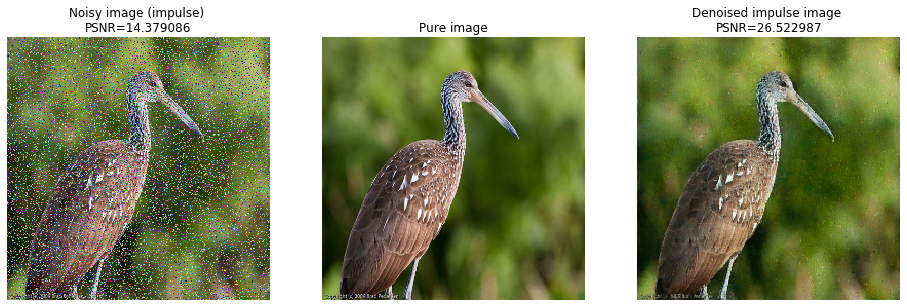

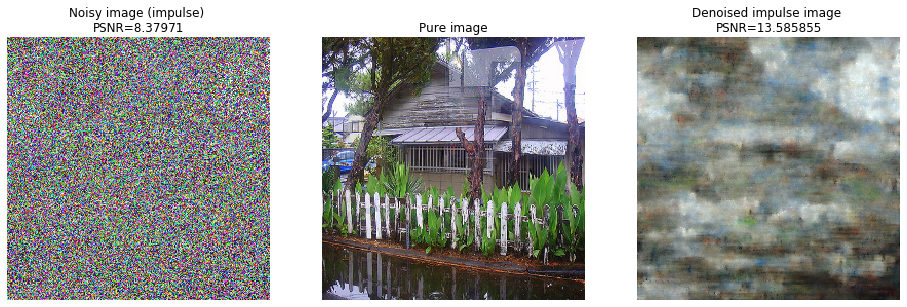

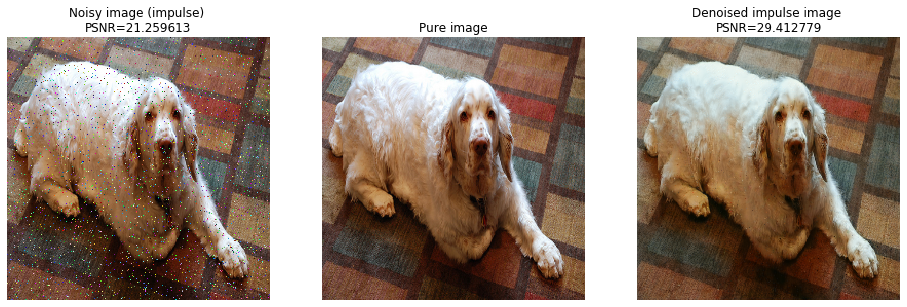

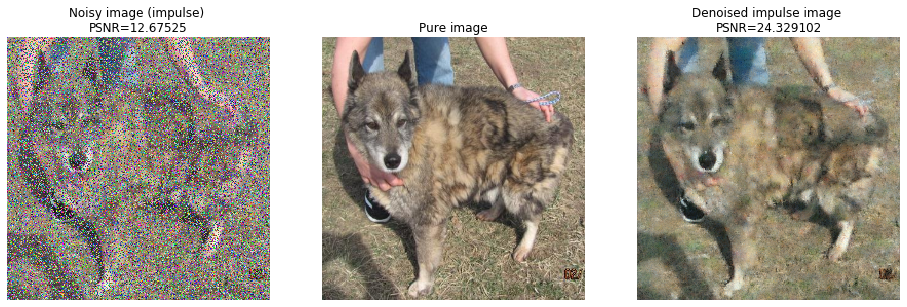

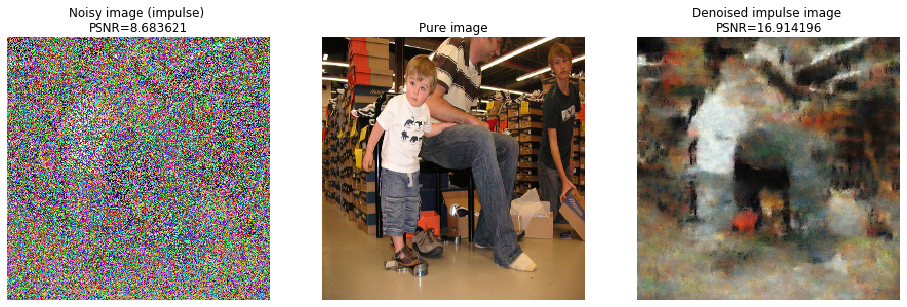

In [41]:
# Plot denoised images (Impulse Noise), Training Images
for i in range(0, 5):
    fig, axes = plt.subplots(1, 3)
    fig.set_size_inches(16, 16)

    axes[0].imshow(x_train_imp[i])
    axes[0].set_title('Noisy image (impulse) \nPSNR='+str(PSNR(x_train[i], x_train_imp[i]).numpy()))
    axes[1].imshow(x_train[i])
    axes[1].set_title('Pure image')
#     axes[2].imshow(denoised_images_g[i])
#     axes[2].set_title('Denoised gaussian image \nPSNR='+str(PSNR(x_train[i], denoised_images_g[i]).numpy()))
#     axes[3].imshow(denoised_images_p[i])
#     axes[3].set_title('Denoised poisson image \nPSNR='+str(PSNR(x_train[i], denoised_images_p[i]).numpy()))
    axes[2].imshow(denoised_images_i[i])
    axes[2].set_title('Denoised impulse image \nPSNR='+str(PSNR(x_train[i], denoised_images_i[i]).numpy()))
    axes[0].axis('off'); axes[1].axis('off'); axes[2].axis('off'); # axes[3].axis('off'); axes[4].axis('off')
    plt.show();

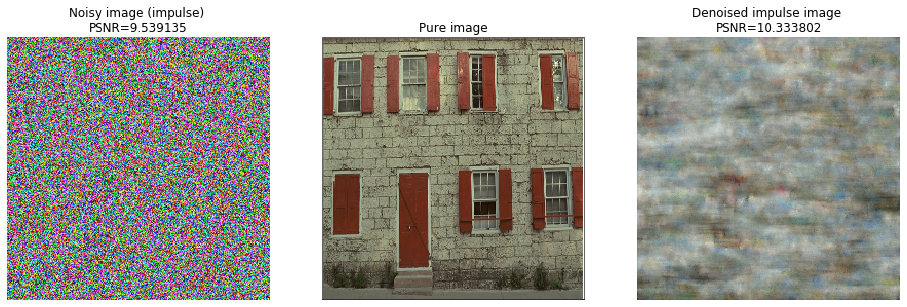

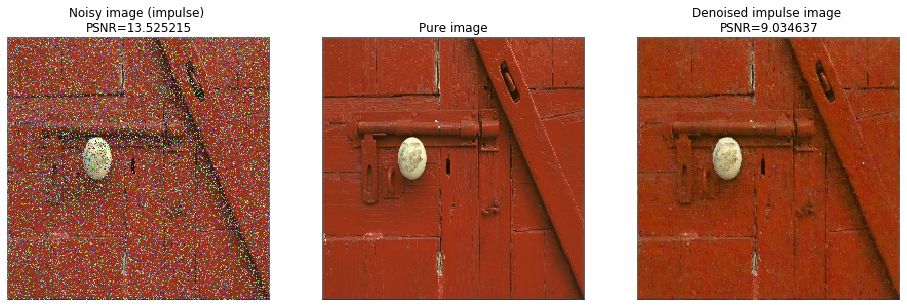

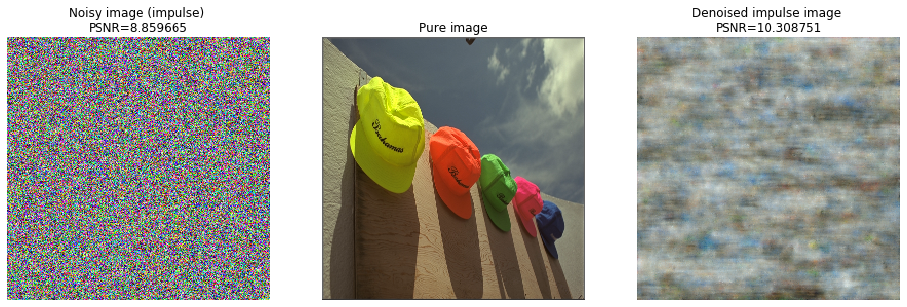

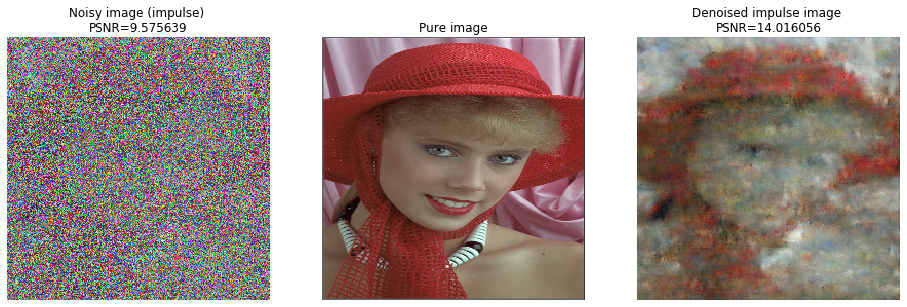

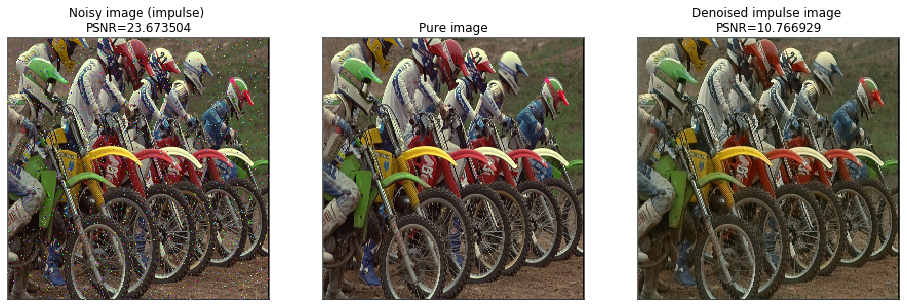

In [42]:
# Plot denoised images (Impulse Noise), Validation Images
for i in range(0, 5):
    fig, axes = plt.subplots(1, 3)
    fig.set_size_inches(16, 16)

    axes[0].imshow(x_val_imp[i])
    axes[0].set_title('Noisy image (impulse) \nPSNR='+str(PSNR(x_val[i], x_val_imp[i]).numpy()))
    axes[1].imshow(x_val[i])
    axes[1].set_title('Pure image')
#     axes[2].imshow(val_denoised_images_g[i])
#     axes[2].set_title('Denoised gaussian image \nPSNR='+str(PSNR(x_val[i], val_denoised_images_g[i]).numpy()))
#     axes[3].imshow(val_denoised_images_p[i])
#     axes[3].set_title('Denoised poisson image \nPSNR='+str(PSNR(x_val[i], val_denoised_images_p[i]).numpy()))
    axes[2].imshow(val_denoised_images_i[i])
    axes[2].set_title('Denoised impulse image \nPSNR='+str(PSNR(x_train[i], val_denoised_images_i[i]).numpy()))
    axes[0].axis('off'); axes[1].axis('off'); axes[2].axis('off'); #axes[3].axis('off'); axes[4].axis('off')
    plt.show();